<a href="https://colab.research.google.com/github/shameemudheenedt/Sample-Programs/blob/master/Attributions_Getting_started.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 👋 Welcome to the **Feature Attribution** tutorial


In this tutorial, we will see how we can use Feature Attribution methods to study a complex pre-trained model decision. We will take a pre-trained model, several images and run several **Attribution methods** to compare them visually.

<p align="center">
  <img src="https://drive.google.com/uc?export=view&id=1K14-wQj7LHBUdqggMjcbRzwwUKGu426Q"/>
</p>



- 📘 <a href="https://deel-ai.github.io/xplique"> Documentation </a>
- <img src="https://github.githubassets.com/images/icons/emoji/octocat.png" width=20> <a href="https://github.com/deel-ai/xplique"> Github </a>
- 🦊 <a href="https://github.com/deel-ai/xplique/blob/master/TUTORIALS.md"> More Xplique tutorials </a>



# Installing **Xplique** and utils

In [2]:
!pip install -q xplique

import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
from math import ceil
import cv2

%matplotlib inline
%config InlineBackend.figure_format='retina'

import xplique
from xplique.plots import plot_attributions

# 🦊 Download and preprocess some images

2022-06-21 13:14:05 URL:https://images.unsplash.com/photo-1615602127413-459bdb48cf45?ixlib=rb-1.2.1&dl=phil-plante-X2PwqTUpXH8-unsplash.jpg&w=640&q=80&fm=jpg&crop=entropy&cs=tinysrgb [68820/68820] -> "fox1.jpg" [1]
2022-06-21 13:14:06 URL:https://images.unsplash.com/photo-1516934024742-b461fba47600?ixlib=rb-1.2.1&dl=sunguk-kim-tIfrzHxhPYQ-unsplash.jpg&w=640&q=80&fm=jpg&crop=entropy&cs=tinysrgb [87926/87926] -> "fox2.jpg" [1]
2022-06-21 13:14:06 URL:https://images.unsplash.com/photo-1496196614460-48988a57fccf?ixlib=rb-1.2.1&dl=randall-ruiz-LVnJlyfa7Zk-unsplash.jpg&w=640&q=80&fm=jpg&crop=entropy&cs=tinysrgb [89946/89946] -> "sea_turtle.jpg" [1]
2022-06-21 13:14:07 URL:https://images.unsplash.com/photo-1552833172-fd5ac167c18c?ixlib=rb-1.2.1&dl=zdenek-machacek-sSEEbAzB6fU-unsplash.jpg&w=640&q=80&fm=jpg&crop=entropy&cs=tinysrgb [98009/98009] -> "lynx.jpg" [1]
2022-06-21 13:14:07 URL:https://images.unsplash.com/photo-1616588945355-bb09c77baf29?ixlib=rb-1.2.1&dl=sandra-kapella-41dAczoRYJY-uns

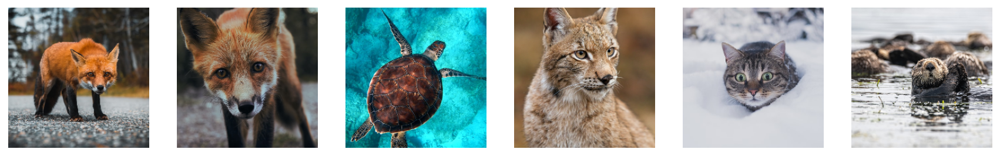

In [3]:
# downloading image from unsplash...
!wget -nv 'https://unsplash.com/photos/X2PwqTUpXH8/download?force=true&w=640' -O 'fox1.jpg'
!wget -nv 'https://unsplash.com/photos/tIfrzHxhPYQ/download?force=true&w=640' -O 'fox2.jpg'
!wget -nv 'https://unsplash.com/photos/LVnJlyfa7Zk/download?force=true&w=640' -O 'sea_turtle.jpg'
!wget -nv 'https://unsplash.com/photos/sSEEbAzB6fU/download?force=true&w=640' -O 'lynx.jpg'
!wget -nv 'https://unsplash.com/photos/41dAczoRYJY/download?force=true&w=640' -O 'cat.jpg'
!wget -nv 'https://unsplash.com/photos/axqTLZ12Jss/download?force=true&w=640' -O 'otter.jpg'

img_list = [
    ('fox1.jpg', 277),
    ('fox2.jpg', 277),
    ('sea_turtle.jpg', 33),
    ('lynx.jpg', 287),
    ('cat.jpg', 281),
    ('otter.jpg', 360)
]

def central_crop_and_resize(img, size=224):
  """
  Given a numpy array, extracts the largest possible square and resizes it to
  the requested size
  """
  h, w, _ = img.shape

  min_side = min(h, w)
  max_side_center = max(h, w) // 2.0
  
  min_cut = int(max_side_center-min_side//2)
  max_cut = int(max_side_center+min_side//2)
  
  img = img[:, min_cut:max_cut] if w > h else img[min_cut:max_cut]
  img = tf.image.resize(img, (size, size))

  return img 

X = []
Y = []

for img_name, label in img_list:
    img = cv2.imread(img_name)[..., ::-1] # when cv2 load an image, the channels are inversed
    img = central_crop_and_resize(img)
    label = tf.keras.utils.to_categorical(label, 1000)

    X.append(img)
    Y.append(label)

X = np.array(X, dtype=np.float32)
Y = np.array(Y)

plt.rcParams["figure.figsize"] = [15, 6]
for img_id, img in enumerate(X):
  plt.subplot(1, len(X), img_id+1)
  plt.imshow(img/255.0)
  plt.axis('off')

# Simple example: Grad-CAM


We will start by preprocessing our images according to the model expectation. Then we will simply generate **Grad-cam** visualisation and plot it.

💡 Keep in mind that the **different methods share the same api**:


``` python
explainer = ExplainerClass(model, batch_size, *explainer_params)
explanations = explainer(inputs, labels)
```



14548992/14536120 [==============================] - 0s 0us/step


/usr/local/lib/python3.7/dist-packages/xplique/attributions/base.py:139: UserWarning: Output is after softmax, it is recommended to use the layer before.
  warnings.warn("Output is after softmax, it is recommended to "


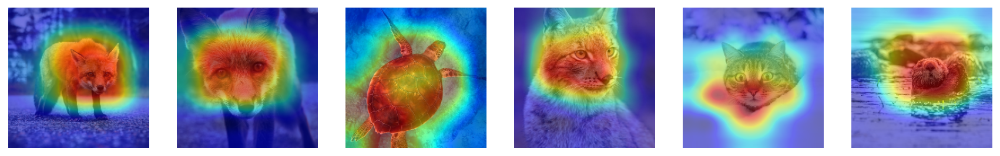

In [4]:
from xplique.attributions import GradCAM
import tensorflow.keras.applications as app

# load the model and preprocess the inputs (adapt the input range)
model, preprocessing = app.MobileNetV2(), app.mobilenet_v2.preprocess_input
X_preprocessed = preprocessing(np.array(X, copy=True))

# create an explainer and generate explanations
explainer = GradCAM(model)
explanations = explainer(X_preprocessed, Y) # `explainer.explain(inputs, labels)` also works

# plot the attribution on top of the image
for i in range(len(X)):
  plt.subplot(1, len(X), i+1)
  plt.imshow(X[i]/255.0)
  plt.imshow(explanations[i], cmap="jet", alpha=0.5)
  plt.axis('off')

# Generate explanations for multiple methods and compare them.


Each explainer has its own parameters, we will instantiate several methods and use the plot functions at our disposal to compare them.

💡 On one hand, explaining the logits is to explain the class. On another hand explaining the softmax is to explain why this class is more likely than another. Thus, it is recommended to remove the softmax activation to explain the logit.

Method: Saliency


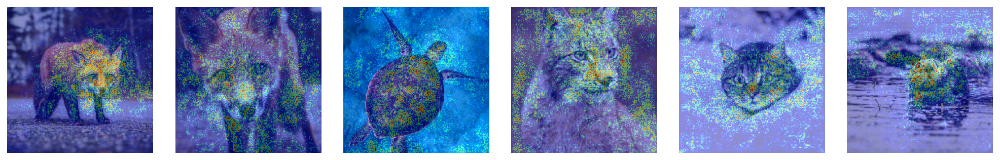



Method: GradientInput


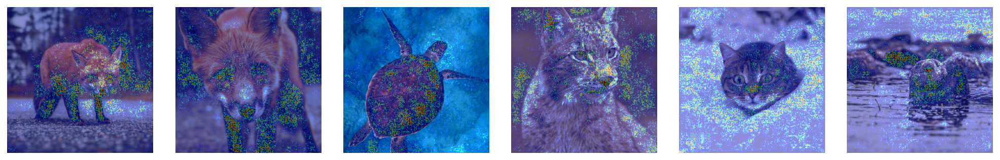



Method: GuidedBackprop


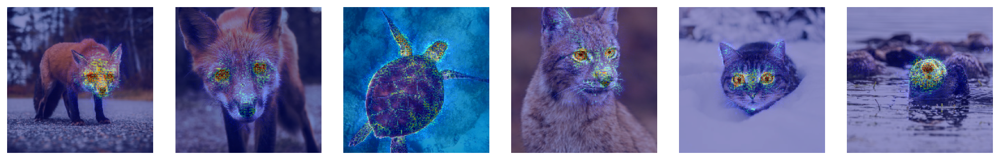



Method: IntegratedGradients


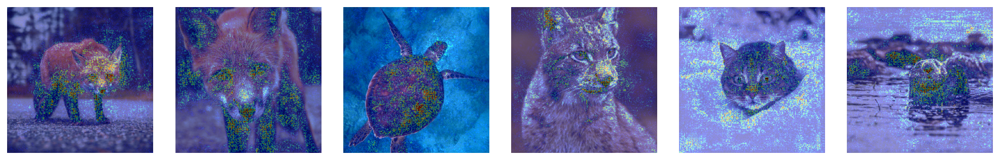



Method: SmoothGrad


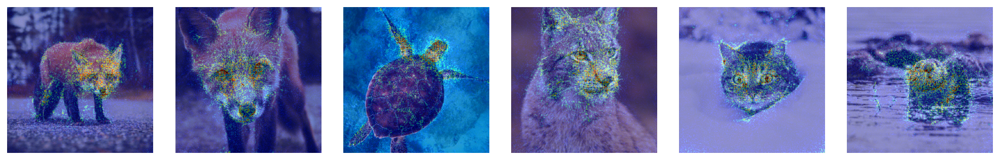



Method: SquareGrad


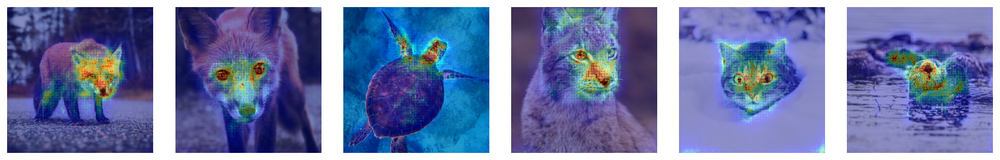



Method: VarGrad


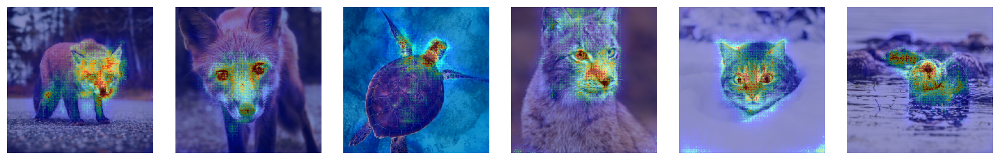



Method: GradCAM


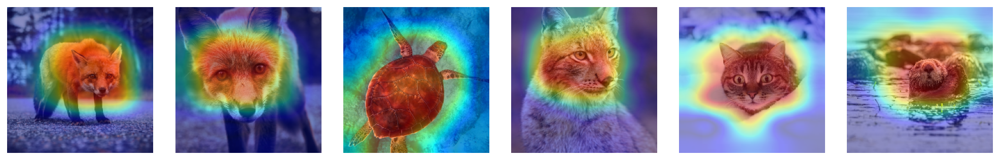



Method: Occlusion


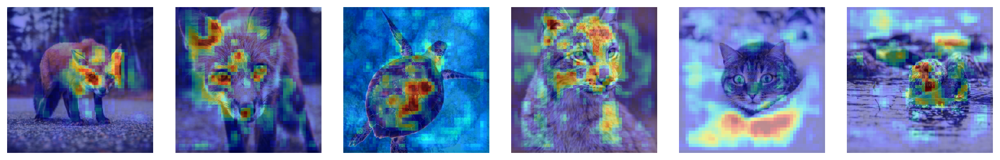



Method: Rise


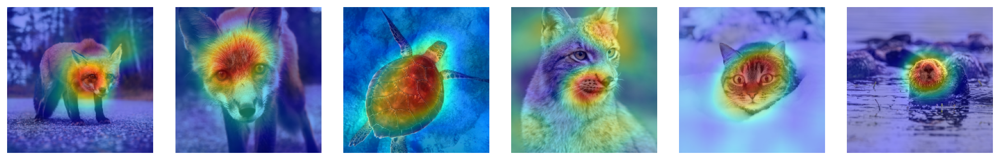

In [5]:
from xplique.attributions import (Saliency, GradientInput, IntegratedGradients, SmoothGrad, VarGrad,
                                  SquareGrad, GradCAM, Occlusion, Rise, GuidedBackprop,
                                  GradCAMPP, Lime, KernelShap)

# explaining the logits is to explain the class, 
# explaining the softmax is to explain why this class is more likely
# it is therefore recommended to explain the logit
model.layers[-1].activation = tf.keras.activations.linear
batch_size = 64

explainers = [
             Saliency(model),
             GradientInput(model),
             GuidedBackprop(model),
             IntegratedGradients(model, steps=80, batch_size=batch_size),
             SmoothGrad(model, nb_samples=80, batch_size=batch_size),
             SquareGrad(model, nb_samples=80, batch_size=batch_size),
             VarGrad(model, nb_samples=80, batch_size=batch_size),
             GradCAM(model),
             Occlusion(model, patch_size=10, patch_stride=5, batch_size=batch_size),
             Rise(model, nb_samples=4000, batch_size=batch_size),
             # Lime(model, nb_samples = 1000),
             # KernelShap(model, nb_samples = 1000)
]

for explainer in explainers:

  explanations = explainer(X_preprocessed, Y)
  
  print(f"Method: {explainer.__class__.__name__}")
  plot_attributions(explanations, X, img_size=2., cmap='jet', alpha=0.4,
                    cols=len(X), absolute_value=True, clip_percentile=0.5)
  plt.show()
  print("\n")

# 🎉 Congratulations
**you now know how to use the Feature Attribution module of Xplique !**